In [1]:
# to install the correct version of pytorch for this CUDA device:
# conda install pytorch torchvision torchaudio cudatoolkit=11.1 -c pytorch -c nvidia
#
# scvi-tools was installed using the conda instructions on the scvi website
# scanpy was installed using the conda instructions on the scanpy website

import scvi
import torch
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import os
import pandas as pd
import skmisc

torch.cuda.is_available()

sc.settings.set_figure_params(dpi=300, figsize=(4,4), facecolor='white')


/data/homezvol1/smorabit/swaruplab/smorabit/bin/software/alsppg_miniconda3/envs/cellbender/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


ModuleNotFoundError: No module named 'scanpy'

In [2]:
import scvi

In [ ]:
os.chdir('/dfs3b/swaruplab/smorabit/analysis/ADDS_2021/splitseq/integration/')
data_dir = 'data/'
fig_dir = 'figures/'

## Merging 4 datasets into one object
* Load individual datasets 
* Keep relevant meta-data from all datasets 
* Only keep genes common to all datasets 
* Merge into one anndata object

## Morabito & Miyoshi et al 2021

In [182]:
adata_morabito = sc.read_h5ad("/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Swarup_2021/data/Swarup_2021_processed.h5ad")

In [183]:
## Morabito et al 

adata_morabito.obs['Study'] = 'Morabito'

# just keep the relevant columns
cols = ['orig_barcode', 'n_counts', 'doublet_scores', 'Sample', 'Diagnosis', 'Study', 'Batch', 'Age', 'Sex', 'PMI', 'Tangle.Stage', 'Plaque.Stage', 'cell_type', 'annotation']
adata_morabito.obs = adata_morabito.obs[cols]

# re-name to match:
adata_morabito.obs = adata_morabito.obs.rename({
    'Tangle.Stage': 'braaksc',
    'Plaque.Stage': 'ceradsc'
}, axis=1)


# add tissue column
adata_morabito.obs['Tissue'] = 'PFC'
adata_morabito.obs['Chemistry'] = '10X_v3'
adata_morabito.obs['Sample'] = adata_morabito.obs['Study'].astype(str) + "_" +adata_morabito.obs['Sample'].astype(str)
adata_morabito.obs['Batch'] = adata_morabito.obs['Study'].astype(str) + "_" + adata_morabito.obs['Batch'].astype(str)


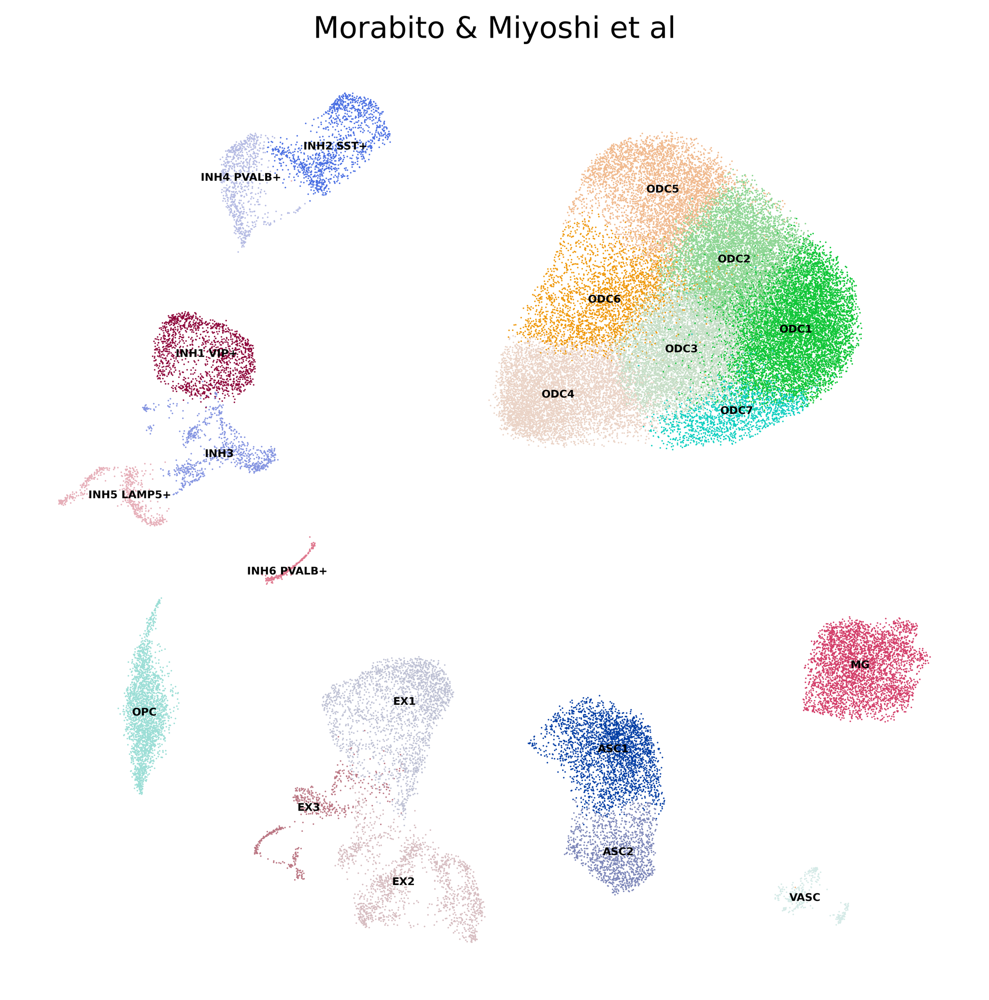

In [184]:
sc.pl.umap(
    adata_morabito,
    color=["annotation"],
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data', 
    title='Morabito & Miyoshi et al'
)


In [185]:
adata_morabito.X = adata_morabito.layers['counts']
adata_morabito.write("/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Swarup_2021/data/Swarup_2021_processed_counts.h5ad")



## ADDS 2022

In [81]:

# adata_adds = sc.read_h5ad('/dfs3b/swaruplab/smorabit/analysis/ADDS_2021/scvi/data/ADDS_integrated_adata_filtered_11-12-21.h5ad')
adata_adds = sc.read('/dfs3b/swaruplab/smorabit/analysis/ADDS_2021/splitseq/data/ADDS_subclusters.h5ad')

In [82]:
adata_adds.obs.head()

,cell_barcode,species,rnd1_well,rnd2_well,rnd3_well,umi_count,umi_count_50dup,gene_count,Sublibrary,Batch,...,UMAP_1,UMAP_2,leiden,log_counts,leiden_full,UMAP_full_1,UMAP_full_2,cell_type,annotation,subtype
AGTGGTCATGGAACAA_9-0-0,AGTGGTCATGGAACAA_9,hg38,9,64,3,50168,48576.830705,8902,Sublibrary1_S1,Batch1,...,1.885365,10.731432,0,15.606463,16,9.865245,13.277141,EX,EX1,EX L2-3
ACATTGGCACGCTCGA_20-0-0,ACATTGGCACGCTCGA_20,hg38,20,20,5,50080,48491.621784,8391,Sublibrary1_S1,Batch1,...,1.302990,10.347502,0,15.603684,16,9.240021,13.650092,EX,EX1,EX L2-3
GATGAATCTCTTCACA_21-0-0,GATGAATCTCTTCACA_21,hg38,21,62,94,49718,48141.103272,8019,Sublibrary1_S1,Batch1,...,-2.406851,6.873954,23,15.593741,31,12.402791,9.055484,EX,EX12,EX L3-5
AAGAGATCAGCAGGAA_2-0-0,AAGAGATCAGCAGGAA_2,hg38,2,25,69,49713,48136.261856,8629,Sublibrary1_S1,Batch1,...,14.689492,10.692253,10,15.594033,20,9.625359,5.255204,INH,INH3,INH SST+
GACTAGTAGTACGCAA_14-0-0,GACTAGTAGTACGCAA_14,hg38,14,55,30,49494,47924.207839,8447,Sublibrary1_S1,Batch1,...,5.888000,12.249705,2,15.587132,4,13.846423,16.047785,EX,EX2,EX L2


In [8]:
adata_adds.obs.columns

Index(['cell_barcode', 'species', 'rnd1_well', 'rnd2_well', 'rnd3_well',
       'umi_count', 'umi_count_50dup', 'gene_count', 'Sublibrary', 'Batch',
       'batch', 'n_counts', 'doublet_scores', 'doublets', 'SampleID',
       'BrainBank', 'CaseYear', 'CaseNum', 'Age', 'Sex', 'PMI', 'APoE', 'DX',
       'NPDx1', 'NPDx2', 'NPDx3', 'TangleStage', 'PlaqueStage', 'RIN',
       'Region', 'Randomize', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels',
       'UMAP_1', 'UMAP_2', 'leiden', 'log_counts', 'leiden_full',
       'UMAP_full_1', 'UMAP_full_2', 'cell_type', 'annotation', 'subtype'],
      dtype='object')

In [83]:

adata_adds.obs['Study'] = 'ADDS'

# just keep the relevant columns
cols = ['cell_barcode', 'n_counts', 'doublet_scores', 'SampleID', 'DX', 'Study', 'Batch', 'Age', 'Sex', 'PMI', 'TangleStage', 'PlaqueStage', 'cell_type', 'annotation', 'subtype', 'Region']
adata_adds.obs = adata_adds.obs[cols]

# re-name to match:
adata_adds.obs = adata_adds.obs.rename({
    'DX': 'Diagnosis',
    'TangleStage': 'braaksc',
    'PlaqueStage': 'ceradsc',
    'SampleID': 'Sample',
    'cell_barcode': 'orig_barcode',
    'Region': 'Tissue'
}, axis=1)


# add tissue column
adata_adds.obs['Chemistry'] = 'SPLiT-seq'
adata_adds.obs['Sample'] = adata_adds.obs['Study'].astype(str) + "_" +adata_adds.obs['Sample'].astype(str)
adata_adds.obs['Batch'] = adata_adds.obs['Study'].astype(str) + "_" + adata_adds.obs['Batch'].astype(str)


In [91]:
#anno = adata_adds.obs.annotation.to_list()
#subtype = adata_adds.obs.subtype.to_list()

adata_adds.obs['annotation'] = [anno[i] if subtype[i] == 'VASC' else subtype[i] for i in range(adata_adds.shape[0])]

In [93]:
adata_adds.obs = adata_adds.obs.drop('subtype', axis=1)

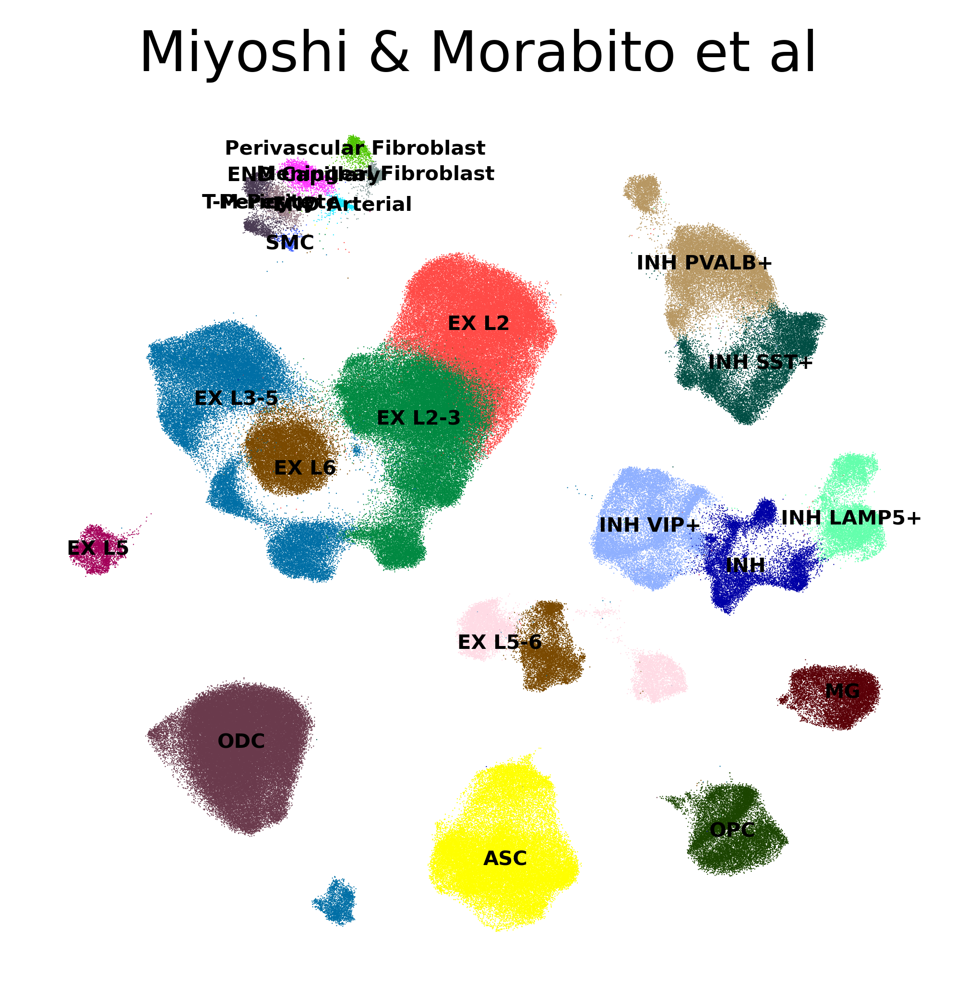

In [92]:

sc.pl.umap(
    adata_adds,
    color=["annotation"],
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data', 
    title='Miyoshi & Morabito et al'
)


## Mathys

In [186]:
adata_mathys = sc.read_h5ad("/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Mathys_2019/data/Mathys_2019_processed.h5ad")


In [187]:
adata_mathys.obs.head()

,orig_barcode,n_counts,doublet_scores,doublets,Sample,Study,barcode,corrected_barcode,sampleID,sex,...,cogdx,dcfdx_lv,individualID,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,annotation
CGCGTTTGTGATGCCC-0,CGCGTTTGTGATGCCC,29271.0,0.128205,Singlet,D17-8758,Mathys_2019,CGCGTTTGTGATGCCC-0,CGCGTTTGTGATGCCC-0,ROS34,female,...,4.0,4.0,R7944883,6688,29271.0,252.0,0.860920,16,EX,EX7
CCGGTAGGTATGCTTG-0,CCGGTAGGTATGCTTG,28540.0,0.128205,Singlet,D17-8758,Mathys_2019,CCGGTAGGTATGCTTG-0,CCGGTAGGTATGCTTG-0,ROS34,female,...,4.0,4.0,R7944883,6726,28540.0,1219.0,4.271198,11,INH,INH2 PVALB+
ACTGTCCGTGCCTGTG-0,ACTGTCCGTGCCTGTG,28395.0,0.173145,Singlet,D17-8758,Mathys_2019,ACTGTCCGTGCCTGTG-0,ACTGTCCGTGCCTGTG-0,ROS34,female,...,4.0,4.0,R7944883,6548,28395.0,938.0,3.303399,5,EX,EX2
CAGCCGATCACAGTAC-0,CAGCCGATCACAGTAC,28324.0,0.137725,Singlet,D17-8758,Mathys_2019,CAGCCGATCACAGTAC-0,CAGCCGATCACAGTAC-0,ROS34,female,...,4.0,4.0,R7944883,6456,28324.0,345.0,1.218048,16,EX,EX7
TGCACCTAGCCAGAAC-0,TGCACCTAGCCAGAAC,28243.0,0.119565,Singlet,D17-8758,Mathys_2019,TGCACCTAGCCAGAAC-0,TGCACCTAGCCAGAAC-0,ROS34,female,...,4.0,4.0,R7944883,6752,28243.0,962.0,3.406154,8,INH,INH1 VIP+


In [188]:
# only keep columns we care about:
cols = ['orig_barcode', 'n_counts', 'doublet_scores', 'Study', 'Sample', 'sex', 'diagnosis',  'age_death', 'pmi', 'braaksc', 'ceradsc', 'cell_type', 'annotation']
adata_mathys.obs = adata_mathys.obs[cols]

# re-name to match:
adata_mathys.obs = adata_mathys.obs.rename({
    'sex': 'Sex',
    'diagnosis': 'Diagnosis',
    'age_death': 'Age',
    'pmi': 'PMI',
    
}, axis=1)

# add more columns:
adata_mathys.obs['Tissue'] = 'PFC'
adata_mathys.obs['Chemistry'] = '10X_v2'
adata_mathys.obs['Sample'] = adata_mathys.obs['Study'].astype(str) + "_" + adata_mathys.obs['Sample'].astype(str)
adata_mathys.obs['Batch'] = adata_mathys.obs['Study']


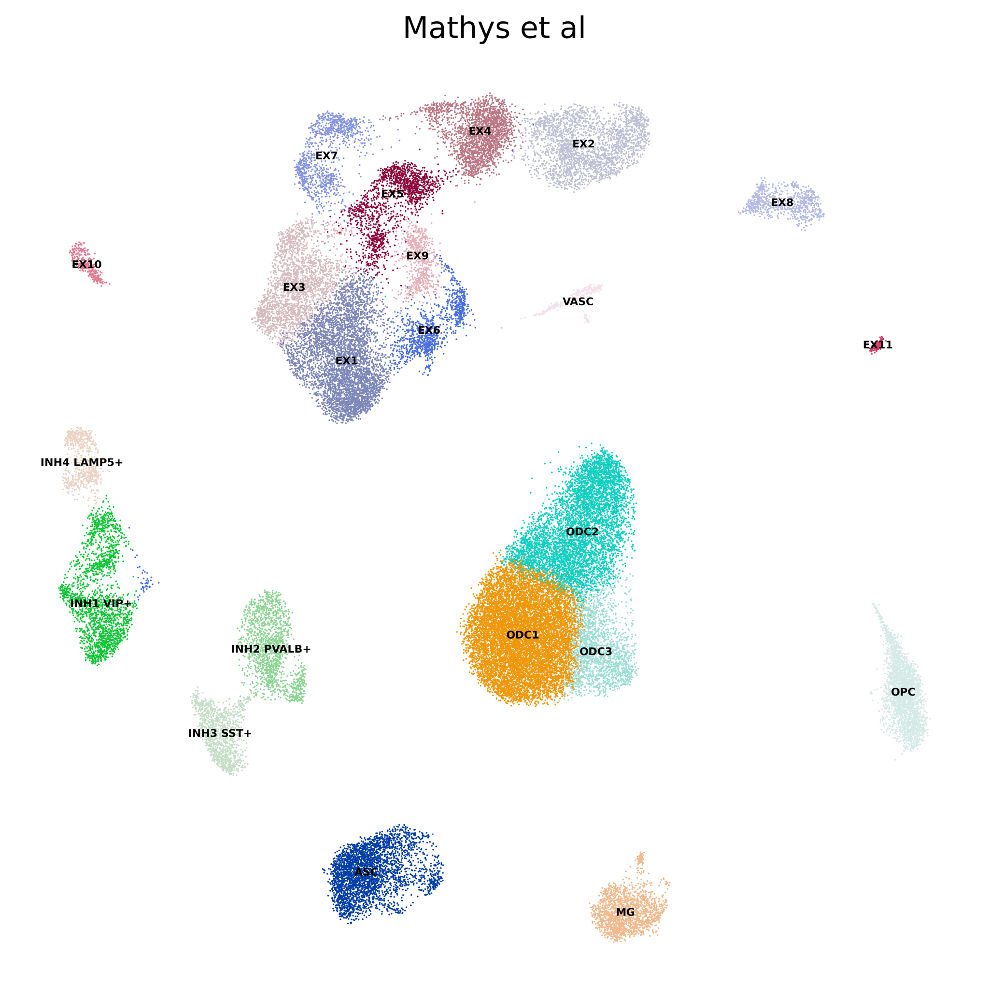

In [189]:
sc.pl.umap(
    adata_mathys,
    color=["annotation"],
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data', 
    title='Mathys et al'
)

In [190]:
adata_mathys.X = adata_mathys.layers['counts']
adata_mathys.write("/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Mathys_2019/data/Mathys_2019_processed_counts.h5ad")


## Zhou

In [191]:
# load individually processed datasets:
adata_zhou = sc.read_h5ad("/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Zhou_2020/data/Zhou_2020_processed.h5ad")



In [192]:
# only keep columns we care about:
cols = ['orig_barcode', 'n_counts', 'doublet_scores', 'Study', 'Sample', 'group', 'msex',  'age_death', 'pmi', 'ceradsc', 'braaksc', 'cell_type', 'annotation']
adata_zhou.obs = adata_zhou.obs[cols]

# re-name to match:
adata_zhou.obs = adata_zhou.obs.rename({
    'group': 'Diagnosis',
    'age_death': 'Age',
    'msex': 'Sex',
    'pmi': 'PMI'
}, axis=1)

# add more columns:
adata_zhou.obs['Tissue'] = 'PFC'
adata_zhou.obs['Chemistry'] = '10X_v2'
adata_zhou.obs['Sample'] = adata_zhou.obs['Study'].astype(str) + "_" +adata_zhou.obs['Sample'].astype(str)
adata_zhou.obs['Batch'] = adata_zhou.obs['Study']


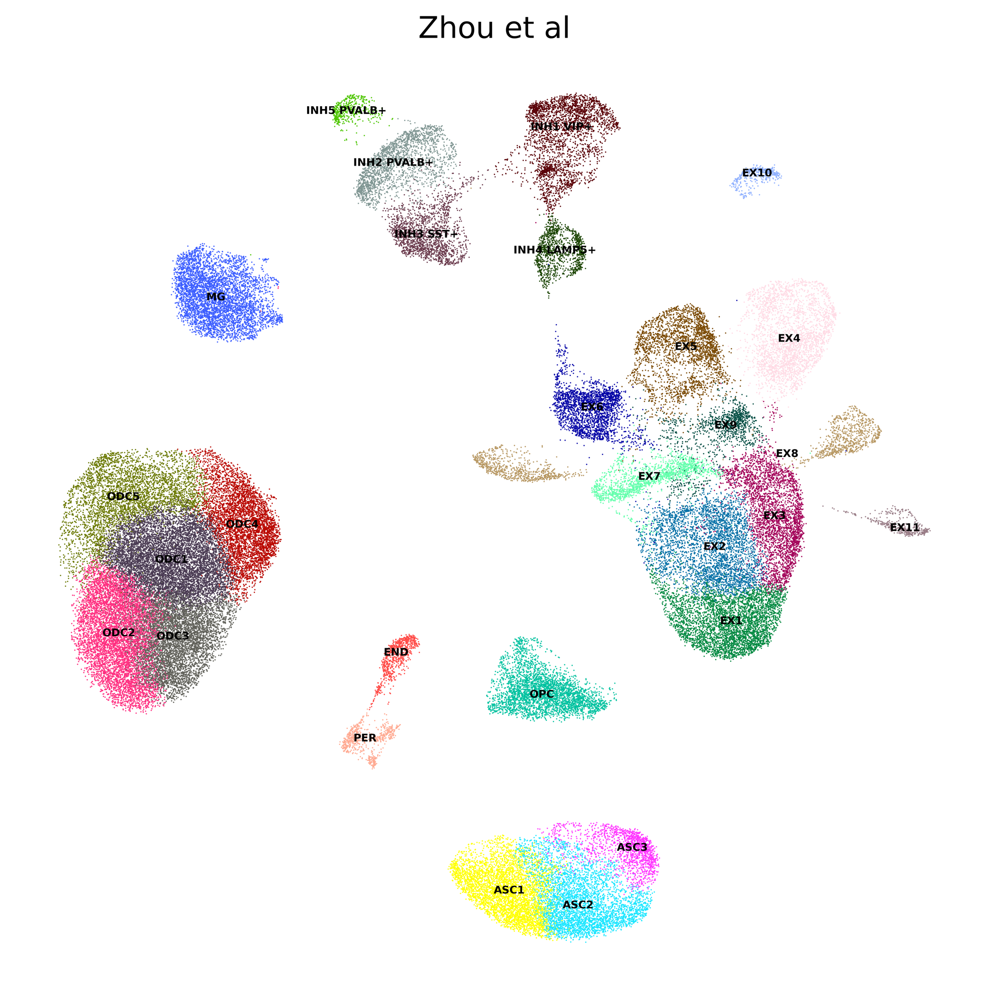

In [193]:

sc.pl.umap(
    adata_zhou,
    color=["annotation"],
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data', 
    title='Zhou et al'
)


In [194]:
adata_zhou.X = adata_zhou.layers['counts']
adata_zhou.write("/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Zhou_2020/data/Zhou_2020_processed_counts.h5ad")


## Reference mapping 

Mapping datasets onto the ADDS data:

## add full counts matrix to ADDS dataset

In [101]:
# get counts matrix for Seurat:
adata_unf = sc.read_h5ad('/dfs3b/swaruplab/smorabit/analysis/ADDS_2021/doublet_detection/data/ADDS_cellbender_scrublet_unfiltered.h5ad')


In [102]:
adata_unf = adata_unf[adata_adds.obs.index]
adata_unf.obs = adata_adds.obs

In [103]:
adata_unf.layers['counts'] = adata_unf.X

In [104]:
adata_adds = adata_unf

## subset each adata to have the same genes:

In [105]:
gene_overlap = list(set.intersection(set(adata_adds.var.index.to_list()), set(adata_morabito.var.index.to_list())))

In [106]:
adata_adds = adata_adds[:,gene_overlap].copy()
adata_morabito = adata_morabito[:,gene_overlap].copy()
adata_mathys = adata_mathys[:,gene_overlap].copy()
adata_zhou = adata_zhou[:,gene_overlap].copy()

In [107]:
adata_adds.X = adata_adds.layers['counts']
adata_morabito.X = adata_morabito.layers['counts']
adata_mathys.X = adata_mathys.layers['counts']
adata_zhou.X = adata_zhou.layers['counts']

## Train SCVI / SCANVI on the ADDS dataset (reference)

In [108]:
adata_adds.var['mt'] = adata_adds.var_names.str.startswith('MT-') 
sc.pp.calculate_qc_metrics(adata_adds, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [109]:
# pre-processing
sc.pp.filter_genes(adata_adds, min_counts=3)
adata_adds.layers["counts"] = adata_adds.X.copy() # preserve counts
sc.pp.normalize_total(adata_adds, target_sum=1e4)
sc.pp.log1p(adata_adds)
adata_adds.raw = adata_adds # freeze the state in `.raw`

In [110]:
# feature selection
sc.pp.highly_variable_genes(
    adata_adds,
    flavor="seurat_v3",
    n_top_genes=3000,
    layer="counts",
    batch_key="Batch",
    subset=True
)

In [111]:
adata_adds.obs["labels_scanvi"] = adata_adds.obs["annotation"].values

In [112]:
# scvi.model.SCVI.setup_anndata(
#     adata_adds, 
#     batch_key="Batch", 
#     layer="counts",
#     categorical_covariate_keys=['Sample', 'Diagnosis', 'Tissue'],
#     continuous_covariate_keys=['pct_counts_mt', 'total_counts', 'Age', 'PMI']
# )

scvi.model.SCANVI.setup_anndata(
    adata_adds,
    batch_key="Batch",
    labels_key="labels_scanvi",
    layer="counts",
     # categorical_covariate_keys=['Sample', 'Diagnosis', 'Tissue'],
   # continuous_covariate_keys=['pct_counts_mt', 'total_counts', 'Age', 'PMI']
    
)


INFO     Using batches from adata.obs["Batch"]                                               
INFO     Using labels from adata.obs["labels_scanvi"]                                        
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 396277 cells, 3000 vars, 5        
         batches, 22 labels, and 0 proteins. Also registered 0 extra categorical covariates  
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


In [113]:
arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    n_hidden = 128,
    n_latent = 30,
    dropout_rate=0.2,
    n_layers=2,
  
)


In [114]:
scvi_model = scvi.model.SCVI(adata_adds, **arches_params)
scvi_model.train(batch_size=1024, max_epochs=50)


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 50/50: 100%|██████████| 50/50 [04:58<00:00,  5.97s/it, loss=858, v_num=1]


### SCANVI

In [115]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model, 
    unlabeled_category="Unknown"
)


In [116]:
scanvi_model.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                             


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 20/20: 100%|██████████| 20/20 [17:36<00:00, 52.84s/it, loss=975, v_num=1]


In [117]:
dir_path_scan = "adds_model_scanvi/"
scanvi_model.save(dir_path_scan, overwrite=True)

In [118]:
adata_adds.obsm["X_scANVI"] = scanvi_model.get_latent_representation()

## update with query: morabito & miyoshi

In [119]:
# susbet to just have HVGs
adata_morabito = adata_morabito[:,adata_adds.var.index.to_list()].copy()

In [120]:
# setup the dummy labels
adata_morabito.obs['labels_scanvi'] = 'Unknown'

In [121]:
# setup the model
vae_q = scvi.model.SCANVI.load_query_data(
    adata_morabito,
    dir_path_scan
)

INFO     Using data from adata.layers["counts"]                                              


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/scvi/model/base/_archesmixin.py:96: UserWarning: Query integration should be performed using models trained with version >= 0.8
  "Query integration should be performed using models trained with version >= 0.8"
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 57950 cells, 3000 vars, 8 batches,
         23 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0     
         extra continuous covariates.                                                        


In [122]:
# change the labels
vae_q._unlabeled_indices = np.arange(adata_morabito.n_obs)
vae_q._labeled_indices = []

In [123]:
# train the model for ref mapping
vae_q.train(
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
)

INFO     Training for 100 epochs.                                                            


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 100/100: 100%|██████████| 100/100 [10:25<00:00,  6.25s/it, loss=1.11e+03, v_num=1]


In [124]:
dir_path_scan = "adds_model_scanvi_morabito/"
vae_q.save(dir_path_scan, overwrite=True)

In [125]:
# add latent rep
adata_morabito.obsm["X_scANVI"] = vae_q.get_latent_representation()
adata_morabito.obs["predictions"] = vae_q.predict()

In [126]:
vae_q.predict(soft=True)

,ASC,END Arterial,END Capillary,EX L2,EX L2-3,EX L3-5,EX L5,EX L5-6,EX L6,INH,...,INH SST+,INH VIP+,M-Pericyte,MG,Meningeal Fibroblast,ODC,OPC,Perivascular Fibroblast,SMC,T-Pericyte
TTCTGTACAGCATGCC-0,5.477458e-16,7.668371e-14,2.984755e-14,4.521957e-16,1.092065e-15,1.614014e-17,1.763895e-14,3.615250e-13,2.365153e-17,1.055953e-15,...,7.574335e-14,2.867522e-14,2.727575e-17,4.516596e-16,3.747126e-20,5.099046e-18,1.424201e-15,2.722209e-19,6.214354e-16,1.455905e-18
CACTGGGAGTCACAGG-0,1.005515e-16,1.047548e-14,5.181753e-19,4.148797e-13,1.000000e+00,2.815626e-12,7.996239e-16,2.805390e-17,2.148577e-13,1.440856e-17,...,3.476539e-21,2.081422e-15,3.852466e-14,7.512599e-17,1.386609e-17,3.580367e-18,4.699702e-18,4.616322e-15,1.264967e-16,3.095046e-15
GTTCTATTCTTCACGC-0,1.451664e-16,5.576268e-14,3.690361e-13,4.686762e-16,4.680267e-09,1.000000e+00,9.488479e-11,3.287636e-14,1.881965e-12,3.929642e-17,...,1.114474e-16,1.056581e-16,9.840979e-17,2.019499e-17,6.291998e-16,3.862249e-15,7.505495e-17,8.122901e-17,6.077883e-16,2.593486e-15
CGAGGCTAGGATACGC-0,1.361730e-19,2.583661e-15,6.497822e-16,9.987529e-17,3.294517e-10,1.000000e+00,2.902277e-13,5.591508e-14,8.333132e-11,2.660656e-15,...,1.659834e-15,3.068261e-19,7.863055e-16,1.022885e-18,3.060397e-17,6.459170e-16,1.390847e-17,3.251256e-18,2.384569e-15,8.169082e-16
GTGCGTGCACTTCAGA-0,1.097263e-16,2.249521e-14,1.849523e-18,9.230981e-10,1.000000e+00,6.193144e-14,5.957371e-16,4.276423e-16,5.408649e-12,3.079413e-18,...,4.489600e-20,1.036287e-15,2.176949e-14,3.428593e-17,4.617057e-17,4.522005e-18,3.286382e-18,5.871214e-15,4.970073e-17,5.467271e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTCCCTCGTACCGCGT-17,3.011114e-15,2.837612e-19,5.418889e-17,1.573351e-17,9.387771e-20,2.573849e-18,8.278234e-20,9.174157e-19,1.086665e-18,6.436949e-19,...,1.066188e-17,2.133145e-18,4.089920e-19,1.766244e-15,1.504629e-15,1.000000e+00,3.772330e-17,1.616597e-16,9.981273e-19,2.686025e-18
TGTTCTATCCAAAGGG-17,3.002390e-12,4.067310e-13,7.962275e-11,7.580000e-14,1.107431e-15,1.251919e-16,2.181647e-20,6.368546e-16,3.726117e-19,9.160537e-15,...,5.828458e-15,5.241779e-17,7.305622e-14,1.000000e+00,1.003347e-12,3.123646e-13,1.704592e-14,3.250906e-12,1.540562e-16,1.455896e-16
AGGTAGGTCGTGAGAG-17,5.512151e-15,2.960086e-19,1.955403e-16,1.016949e-16,1.613557e-19,1.167936e-17,1.321642e-19,1.468069e-18,2.796275e-18,1.457322e-18,...,4.682721e-17,4.311488e-18,6.088456e-19,9.356655e-15,2.204912e-15,1.000000e+00,1.024573e-16,1.399016e-16,1.705115e-18,6.052219e-18
AACCAACGTTAGGAGC-17,2.388018e-12,1.524619e-13,2.136422e-11,4.855800e-14,5.458393e-16,7.635506e-17,1.617630e-20,5.866733e-16,2.096222e-19,1.450810e-14,...,8.884490e-15,4.142383e-17,3.524073e-14,1.000000e+00,6.245973e-13,5.488018e-13,1.329047e-14,2.041420e-12,1.212171e-16,1.072589e-16


In [127]:
adata_morabito.obs.predictions.value_counts()

ODC                        37796
ASC                         4256
MG                          3544
OPC                         2533
EX L2                       1790
INH VIP+                    1483
EX L3-5                     1414
INH PVALB+                  1224
INH SST+                    1108
INH                          797
EX L2-3                      571
INH LAMP5+                   559
EX L5-6                      223
EX L6                        199
EX L5                        131
T-Pericyte                   101
END Capillary                 80
Perivascular Fibroblast       70
SMC                           40
Meningeal Fibroblast          17
END Arterial                   8
M-Pericyte                     6
Name: predictions, dtype: int64

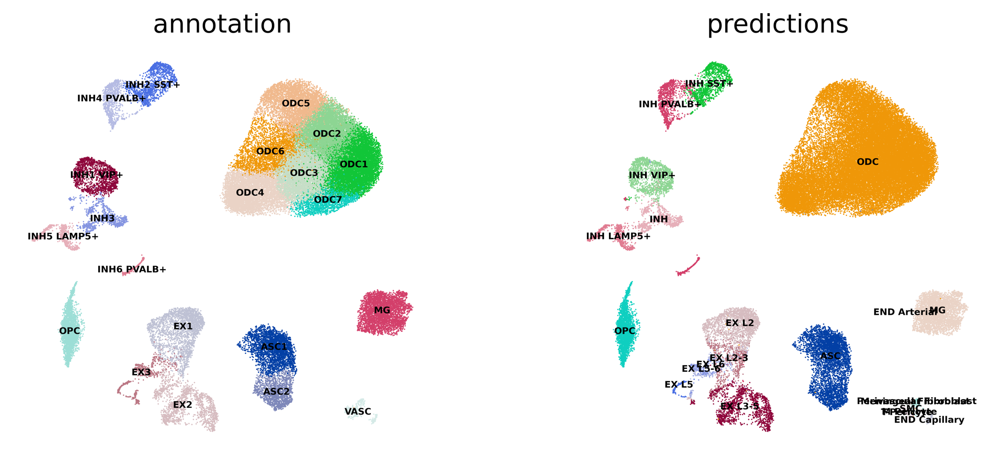

In [128]:
sc.pl.umap(
    adata_morabito,
    color=["annotation", 'predictions'],
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data'
)


## update with query: mathys et al

In [129]:
# susbet to just have HVGs
adata_mathys = adata_mathys[:,adata_adds.var.index.to_list()].copy()

In [130]:
# setup the dummy labels
adata_mathys.obs['labels_scanvi'] = 'Unknown'

In [131]:
# setup the model
vae_q = scvi.model.SCANVI.load_query_data(
    adata_mathys,
    dir_path_scan
)

INFO     Using data from adata.layers["counts"]                                              


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/scvi/model/base/_archesmixin.py:96: UserWarning: Query integration should be performed using models trained with version >= 0.8
  "Query integration should be performed using models trained with version >= 0.8"
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 49155 cells, 3000 vars, 9 batches,
         23 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0     
         extra continuous covariates.                                                        


In [132]:
# change the labels
vae_q._unlabeled_indices = np.arange(adata_mathys.n_obs)
vae_q._labeled_indices = []

In [133]:
# train the model for ref mapping
vae_q.train(
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
)

INFO     Training for 100 epochs.                                                            


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 100/100: 100%|██████████| 100/100 [07:51<00:00,  4.71s/it, loss=966, v_num=1]


In [134]:
dir_path_scan = "adds_model_scanvi_mathys/"
vae_q.save(dir_path_scan, overwrite=True)

In [135]:
# add latent rep
adata_mathys.obsm["X_scANVI"] = vae_q.get_latent_representation()
adata_mathys.obs["predictions"] = vae_q.predict()

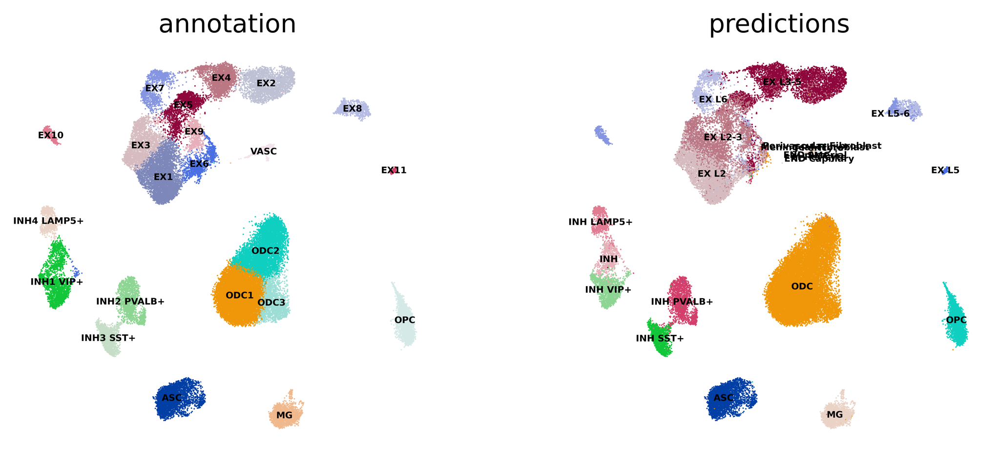

In [136]:
sc.pl.umap(
    adata_mathys,
    color=["annotation", 'predictions'],
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data'
)


## update with query: zhou

In [137]:
# susbet to just have HVGs
adata_zhou = adata_zhou[:,adata_adds.var.index.to_list()].copy()

In [138]:
# setup the dummy labels
adata_zhou.obs['labels_scanvi'] = 'Unknown'

In [139]:
# setup the model
vae_q = scvi.model.SCANVI.load_query_data(
    adata_zhou,
    dir_path_scan
)

INFO     Using data from adata.layers["counts"]                                              


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/scvi/model/base/_archesmixin.py:96: UserWarning: Query integration should be performed using models trained with version >= 0.8
  "Query integration should be performed using models trained with version >= 0.8"
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 82477 cells, 3000 vars, 10        
         batches, 23 labels, and 0 proteins. Also registered 0 extra categorical covariates  
         and 0 extra continuous covariates.                                                  


In [140]:
# change the labels
vae_q._unlabeled_indices = np.arange(adata_zhou.n_obs)
vae_q._labeled_indices = []

In [141]:
# train the model for ref mapping
vae_q.train(
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
)

INFO     Training for 100 epochs.                                                            


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 100/100: 100%|██████████| 100/100 [13:14<00:00,  7.94s/it, loss=1.37e+03, v_num=1]


In [142]:
dir_path_scan = "adds_model_scanvi_zhou/"
vae_q.save(dir_path_scan, overwrite=True)

In [143]:
# add latent rep
adata_zhou.obsm["X_scANVI"] = vae_q.get_latent_representation()
adata_zhou.obs["predictions"] = vae_q.predict()

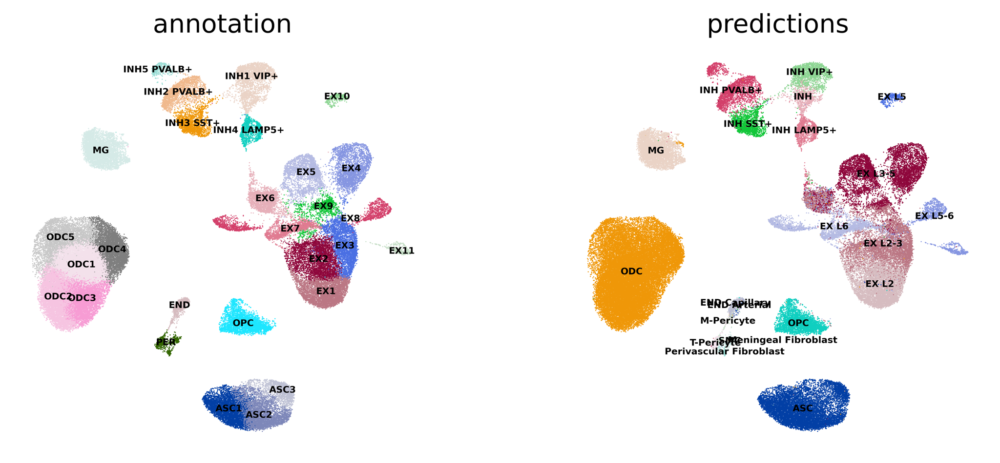

In [144]:
sc.pl.umap(
    adata_zhou,
    color=["annotation", 'predictions'],
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data'
)


## Joint analysis of all 4 datasets:

In [145]:
adata = adata_adds.concatenate([adata_morabito, adata_mathys, adata_zhou])
adata.shape

/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/anndata/_core/merge.py:945: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  UserWarning,
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


(585859, 3000)

In [146]:
# run neighbors
sc.pp.neighbors(adata, use_rep="X_scANVI", metric='cosine', n_neighbors=15)


In [147]:
# run umap
sc.tl.umap(adata, min_dist=0.2)

In [148]:
adata.obs['cell_identity'] = [adata.obs.annotation[i] if adata.obs.Study[i] == 'ADDS' else adata.obs.predictions[i] for i in range(adata.shape[0])]

In [149]:
adata.obs.predictions

AGTGGTCATGGAACAA_9-0-0-0            NaN
ACATTGGCACGCTCGA_20-0-0-0           NaN
GATGAATCTCTTCACA_21-0-0-0           NaN
AAGAGATCAGCAGGAA_2-0-0-0            NaN
GACTAGTAGTACGCAA_14-0-0-0           NaN
                                ...    
GATGCTATCTCTTGAT-31-3           EX L3-5
CAGAGAGTCCTTTCGG-31-3          INH SST+
AGCATACAGGACCACA-31-3               ASC
AGGGAGTGTTACGCGC-31-3        T-Pericyte
GGGCACTCAATGTAAG-31-3                MG
Name: predictions, Length: 585859, dtype: category
Categories (22, object): ['ASC', 'END Arterial', 'END Capillary', 'EX L2', ..., 'OPC', 'Perivascular Fibroblast', 'SMC', 'T-Pericyte']

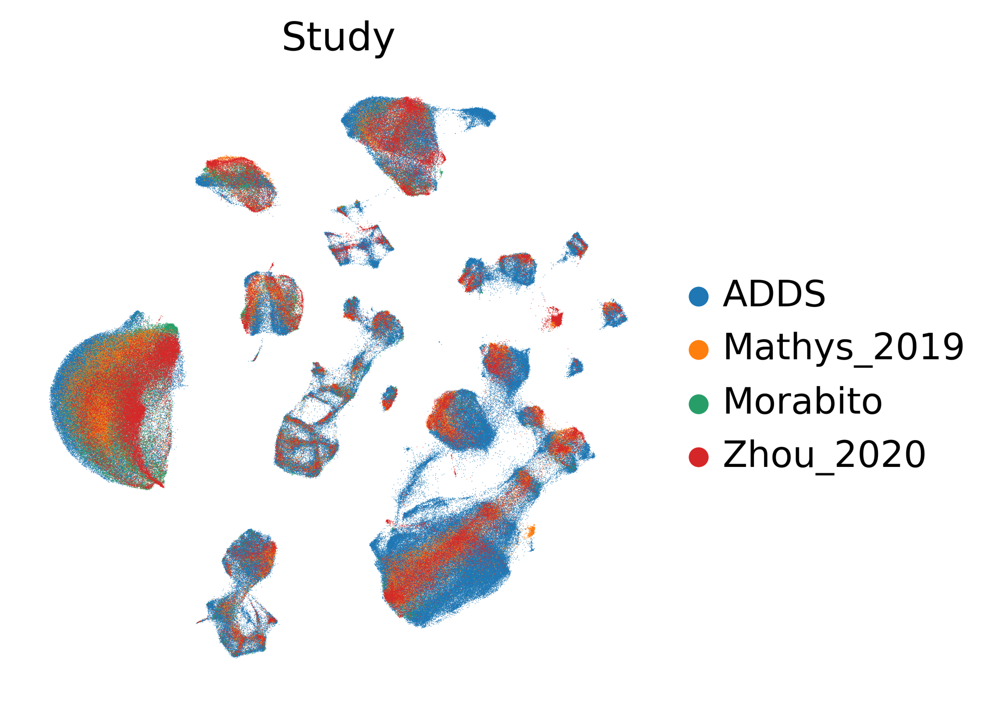

In [150]:
sc.pl.umap(
    adata,
    color=["Study"],
    frameon=False,
)


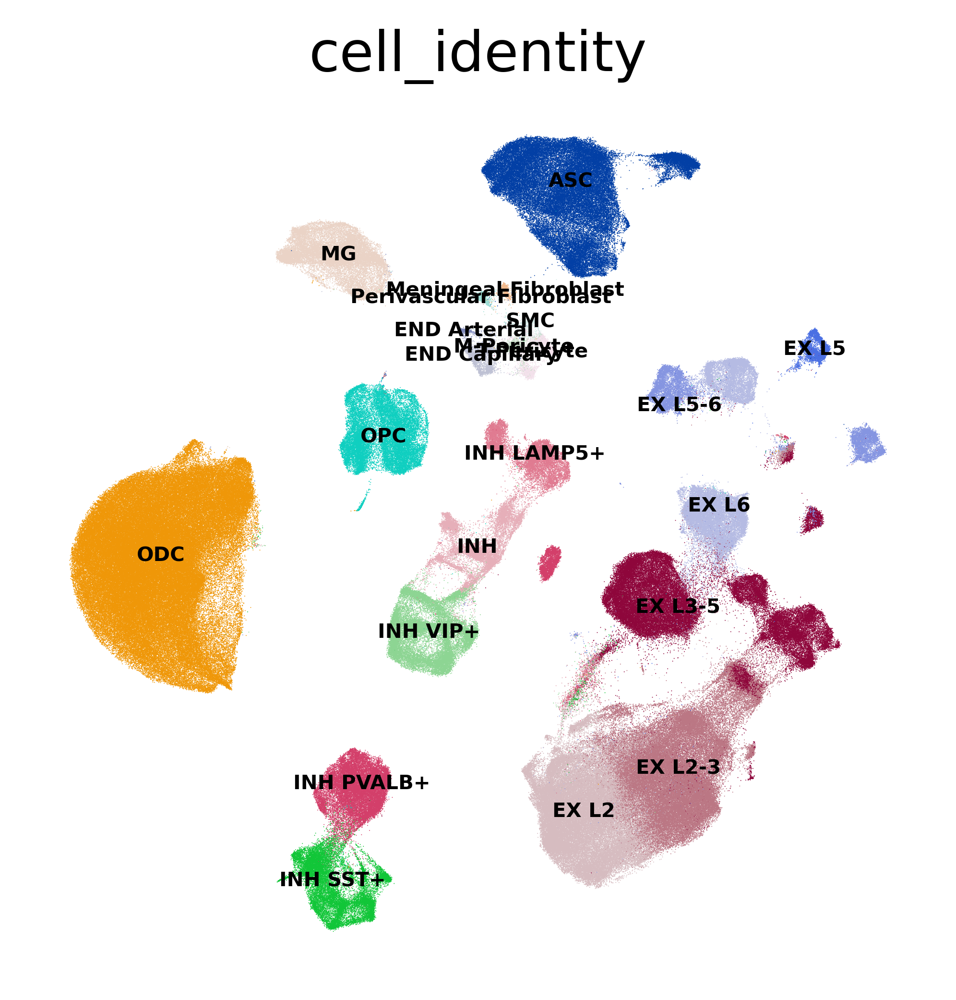

In [151]:
sc.pl.umap(
    adata,
    color=["cell_identity"],
    frameon=False, 
    legend_fontsize=5,
    legend_loc='on data'
)


In [152]:
sc.tl.paga(adata, groups='cell_identity')

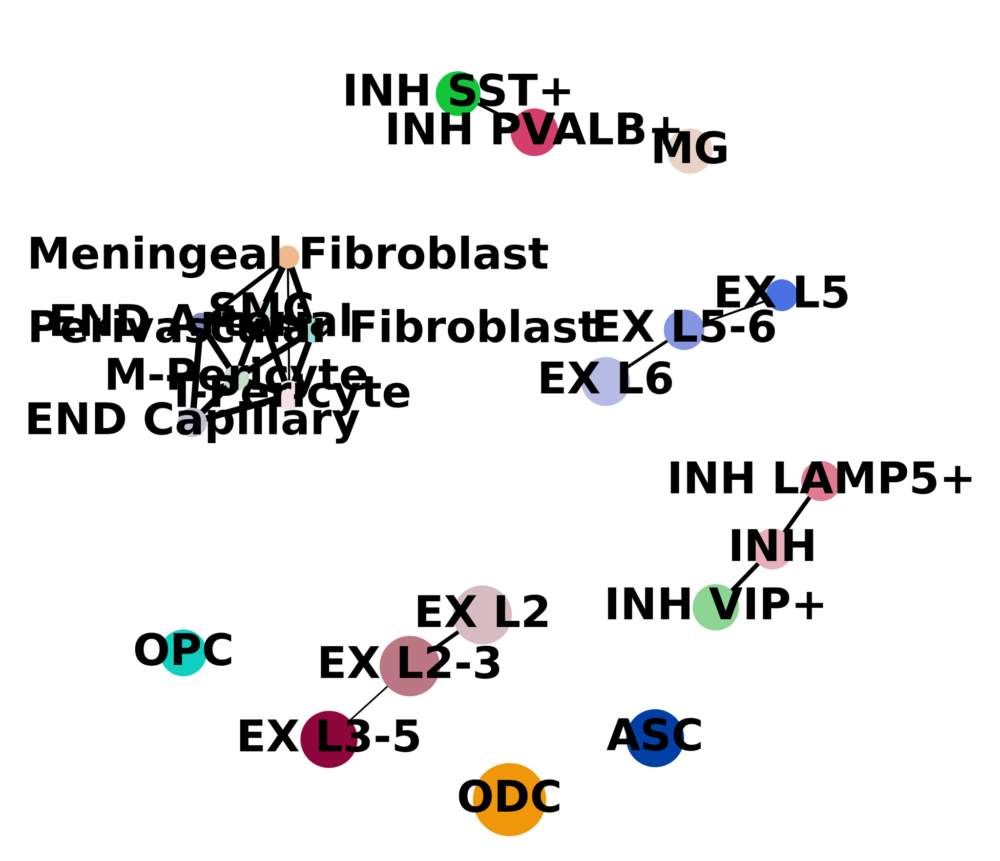

In [155]:
sc.settings.set_figure_params(dpi=300, figsize=(4,4), facecolor='white')
sc.pl.paga(
    adata, threshold=0.25, title='', edge_width_scale=0.25,
    frameon=False, save=True
)

In [156]:
# use scVI latent space for UMAP generation
sc.tl.umap(adata, min_dist=0.2, init_pos='paga')

# add umap to obs table
# adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
# adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]

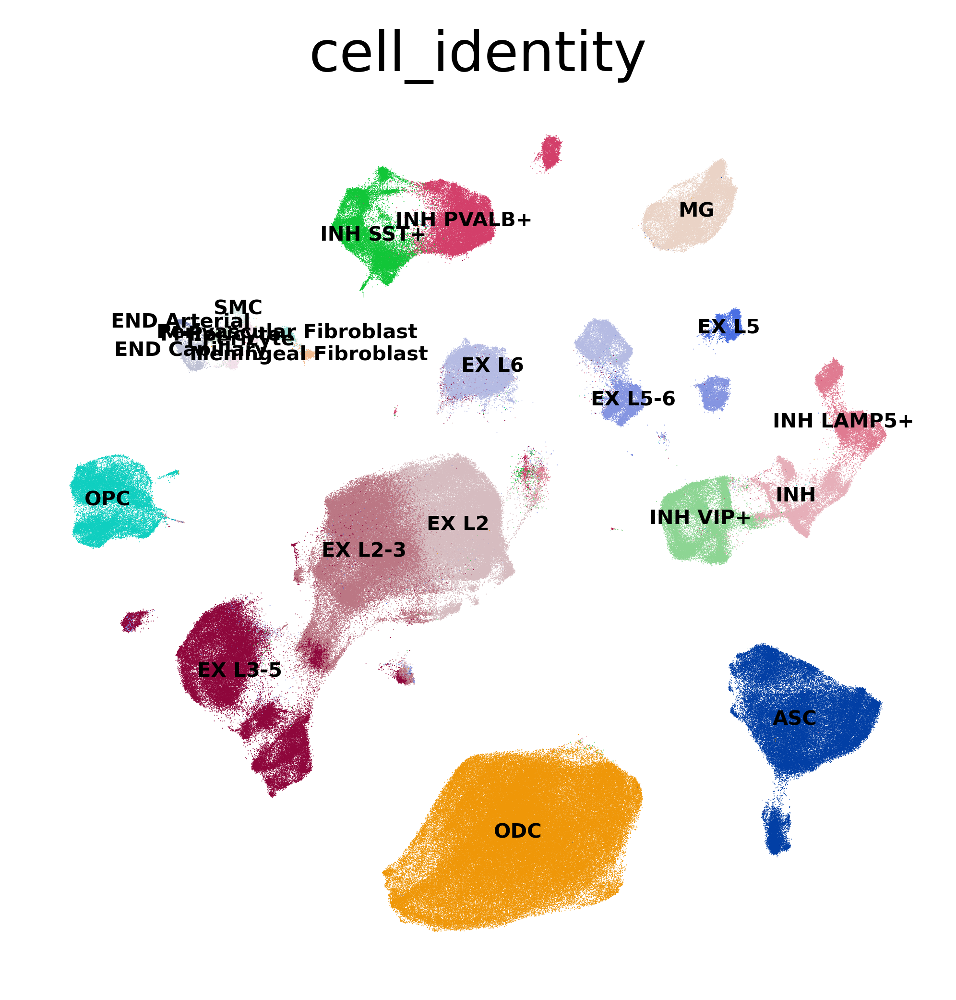

In [157]:
sc.pl.umap(
    adata,
    color=["cell_identity"],
    frameon=False, 
    legend_fontsize=5,
    legend_loc='on data'
)


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scvi-env/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


<AxesSubplot:title={'center':'ADDS'}, xlabel='UMAP1', ylabel='UMAP2'>

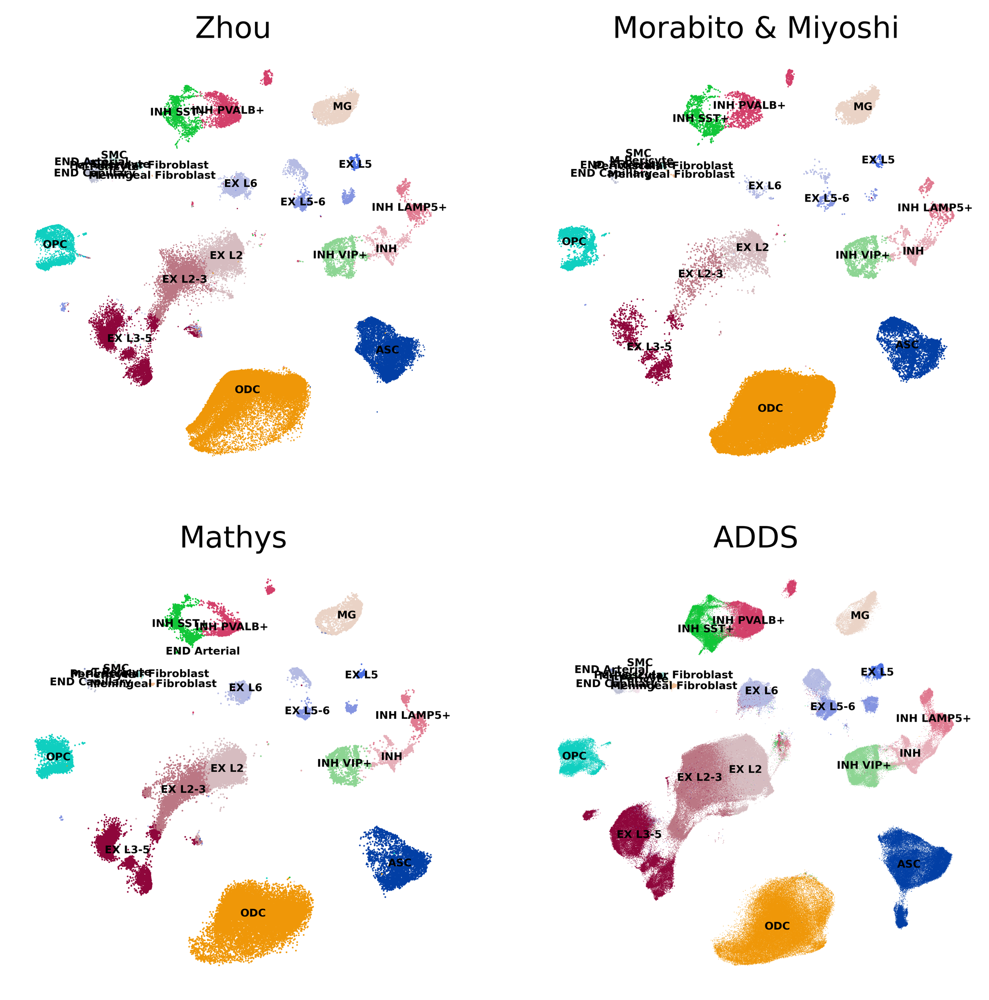

In [158]:
sc.settings.set_figure_params(dpi=300, figsize=(8,8), facecolor='white')


fig, axs = plt.subplots(2, 2)


f1 = sc.pl.umap(
    adata[adata.obs.Study == 'Zhou_2020'],
    color=["cell_identity"],
    frameon=False,
    legend_fontsize=5,
    legend_loc='on data',
    title = 'Zhou',
    ax = axs[0,0],
    show=False
)

sc.pl.umap(
    adata[adata.obs.Study == 'Morabito'],
    color=["cell_identity"],
    frameon=False,
    legend_fontsize=5,
    legend_loc='on data',
    title = 'Morabito & Miyoshi',
    ax = axs[0,1],
    show=False

)

sc.pl.umap(
    adata[adata.obs.Study == 'Mathys_2019'],
    color=["cell_identity"],
    frameon=False,
    legend_fontsize=5,
    legend_loc='on data',
    title = 'Mathys',
    ax = axs[1,0],
    show=False
)

sc.pl.umap(
    adata[adata.obs.Study == 'ADDS'],
    color=["cell_identity"],
    frameon=False,
    legend_fontsize=5,
    legend_loc='on data',
    title = 'ADDS',
    ax = axs[1,1],
    show=False
)




## Save integrated dataset

In [180]:
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]

In [166]:
#ages = adata.obs.Age.to_list()
adata.obs.Age = [90 if x == "90+" else x for x in ages]
adata.obs.Age = adata.obs.Age.astype(float)

In [170]:
# fix sex column
adata.obs.Sex = adata.obs.Sex.replace('male', 'M')
adata.obs.Sex = adata.obs.Sex.replace('female', 'F')
adata.obs.Sex = adata.obs.Sex.replace(1.0, 'M')
adata.obs.Sex = adata.obs.Sex.replace(0.0, 'F')
adata.obs.Sex.unique()

array(['M', 'F'], dtype=object)

In [171]:
# fix braaksc,  make it a cat:
adata.obs.braaksc = adata.obs.braaksc.replace({
    3.0: "3",
    4.0: "4",
    'I': "1",
    'II': "2",
    'III': "3",
    'IV': "4",
    '0-I': "0-1",
    'II-III': "2-3",
    'A0B1C0': "1-2",
    'A3B1C1': "1-2",
    'A2B2C3': "3-4",
    'A3B2C2-3': "3-4",
    'A3B2-3C1-2': "4-5",
    'A2-3B2C2': "3-4",
    'A1B1C0': "1-2",
    'A1B0C?': "0",
    'A2B0C0': '0'

}).astype(str)

In [174]:
# fix braaksc,  make it a cat:
#adata.obs.braaksc = 
adata.obs = adata.obs.drop('ceradsc', axis=1)

In [179]:
adata.write('{}ADDS_AD_integrated.h5ad'.format(data_dir))

In [ ]:
adata = sc.read_h5ad('{}ADDS_AD_integrated.h5ad'.format(data_dir))